# <p><center style="font-family:newtimeroman;font-size:180%;"> Bone Fracture Classification Using X-Ray images </center></p>

# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Import Libraries </p>

In [ ]:
# Import necessary libraries for image processing, deep learning, and data manipulation
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
import tensorflow
from tensorflow.keras.applications import ResNet50,VGG16, VGG19 # Importing VGG19 for potential use
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report,accuracy_score, f1_score
from tensorflow.keras.metrics import Accuracy, Precision, Recall, F1Score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Lambda
import tensorflow as tf

# Check for GPU availability and set the device accordingly
device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
from google.colab import drive
# Mount Google Drive to access the dataset
drive.mount('/content/drive', force_remount=True) # Force remount to refresh credentials

# Define the paths to the training, testing, and validation datasets
train= '/content/drive/MyDrive/BoneFracture/train'
test= '/content/drive/MyDrive/BoneFracture/test'
val= '/content/drive/MyDrive/BoneFracture/val'

Mounted at /content/drive


In [ ]:
# Function to load image paths and labels from subfolders within a dataset directory
def data(dataset_path):
    images = []
    labels = []
    # Iterate through subfolders (assuming subfolder names are labels)
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        # Check if the item is a directory
        if not os.path.isdir(subfolder_path):
            continue
        # Iterate through image files in each subfolder
        for image_filename in os.listdir(subfolder_path):
            # Check if the file is a jpg image
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    # Create a pandas DataFrame with image paths and labels
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

# **VGG19**

# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Read Data </p>

In [ ]:
#train
train=data(train)
train.head()

,image,label
0,/content/drive/MyDrive/BoneFracture/train/not ...,not fractured
1,/content/drive/MyDrive/BoneFracture/train/not ...,not fractured
2,/content/drive/MyDrive/BoneFracture/train/not ...,not fractured
3,/content/drive/MyDrive/BoneFracture/train/not ...,not fractured
4,/content/drive/MyDrive/BoneFracture/train/not ...,not fractured


In [ ]:
#test
test=data(test)
test.head()

,image,label
0,/content/drive/MyDrive/BoneFracture/test/fract...,fractured
1,/content/drive/MyDrive/BoneFracture/test/fract...,fractured
2,/content/drive/MyDrive/BoneFracture/test/fract...,fractured
3,/content/drive/MyDrive/BoneFracture/test/fract...,fractured
4,/content/drive/MyDrive/BoneFracture/test/fract...,fractured


In [ ]:
#val
val=data(val)
val.head()

,image,label
0,/content/drive/MyDrive/BoneFracture/val/not fr...,not fractured
1,/content/drive/MyDrive/BoneFracture/val/not fr...,not fractured
2,/content/drive/MyDrive/BoneFracture/val/not fr...,not fractured
3,/content/drive/MyDrive/BoneFracture/val/not fr...,not fractured
4,/content/drive/MyDrive/BoneFracture/val/not fr...,not fractured


# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Visualization of Dataset </p>

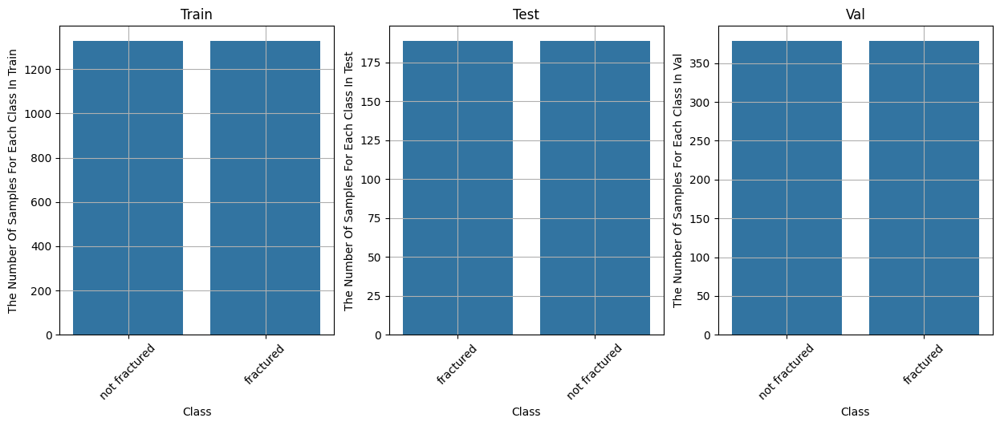

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
ax = sns.countplot(x=train.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,3,2)
ax = sns.countplot(x=test.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,3,3)
ax = sns.countplot(x=val.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Val")
plt.title('Val')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

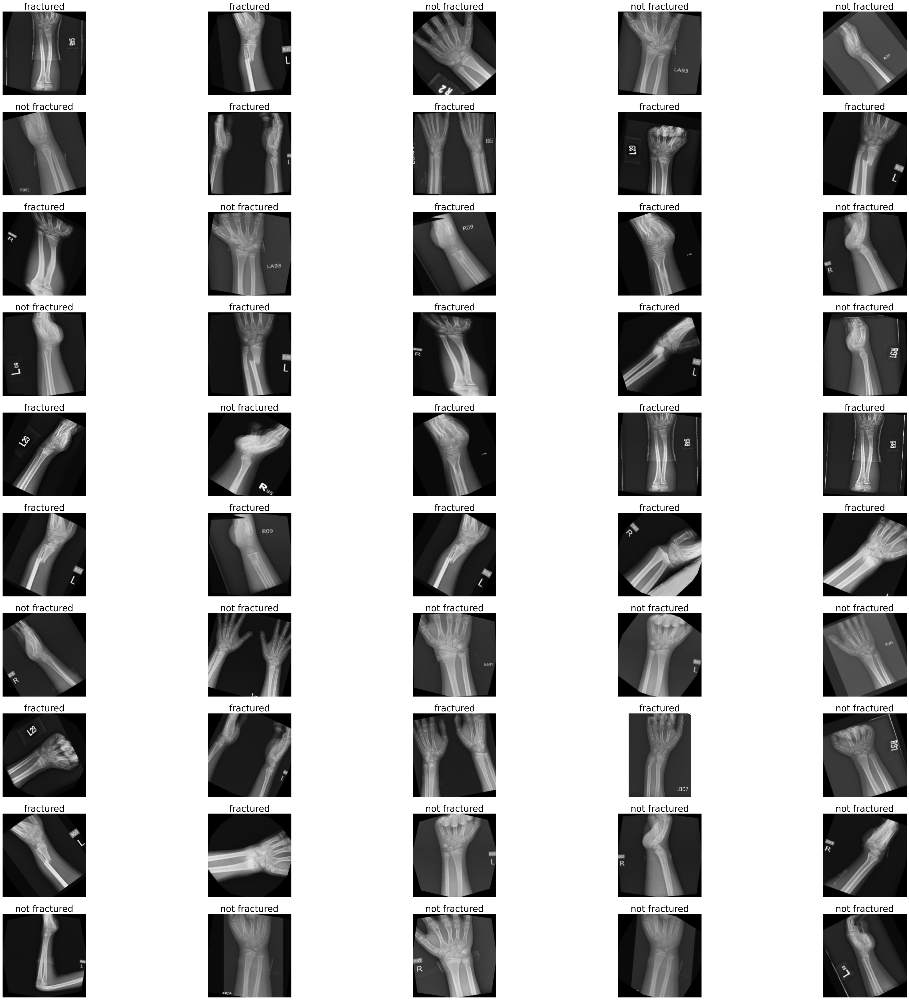

In [ ]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(train),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(train.image[i])
    plt.imshow(img)
    plt.axis('off')
    plt.title(train.label[i],fontsize=25)

# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Data Augmentation </p>

In [ ]:
image_size = (260, 260)
batch_size = 32
datagen = ImageDataGenerator(
    rescale=1./255
)
train_generator = datagen.flow_from_dataframe(
    train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)

Found 2658 validated image filenames belonging to 2 classes.
Found 378 validated image filenames belonging to 2 classes.
Found 758 validated image filenames belonging to 2 classes.


<a id="5"></a>
# <h1 style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Modeling </h1>

In [ ]:
def configure_model(model):
  inputs_1 = tf.keras.Input(shape=(260, 260, 3))
  mymodel=model(input_shape = (260, 260, 3), include_top = False, weights = 'imagenet')
  x = tf.keras.layers.AveragePooling2D(pool_size=(7, 7))(mymodel.output)
  x = tf.keras.layers.Flatten()(x)
  predictors = tf.keras.layers.Dense(1,activation='sigmoid',name='Predictions')(x)
  final_model = Model(mymodel.input, outputs=predictors)
  return final_model

In [ ]:
def model(new_model,layers_num=1,trainable=False):
    for layer in new_model.layers[:layers_num]:
        layer.trainable=trainable
    return new_model

In [ ]:
def scheduler(epoch, lr):
    if epoch < 5:
        return lr
    else:
        return float(lr * tf.math.exp(-0.1).numpy())

In [ ]:
def callbacks(my_model, patience=15):
    checkpoint = tf.keras.callbacks.ModelCheckpoint(f'/content/drive/MyDrive/models/{my_model}.keras', monitor='val_loss', verbose=1, save_best_only=True)
    early=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=patience,min_delta=0.001)
    lr=tf.keras.callbacks.LearningRateScheduler(scheduler)
    callbacks_list=[checkpoint, early,lr]
    return callbacks_list

# **EFFICIENTNET**

In [ ]:
!pip install  efficientnet
import efficientnet.tfkeras as enet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.2 MB/s eta 0:00:00


In [ ]:
efficientnet_model=configure_model(model=enet.EfficientNetB2)

31936256/31936256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
efficientnet_model=model(efficientnet_model)

In [ ]:
opt=tf.keras.optimizers.Adam(0.0001)
efficientnet_model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
callbacks=callbacks('efficientnet_new')

In [ ]:
efficientnet_hist=efficientnet_model.fit(train_generator,epochs=7,validation_data=val_generator,callbacks=callbacks)

Epoch 1/7


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8088 - loss: 0.3929
Epoch 1: val_loss improved from inf to 0.85083, saving model to /content/drive/MyDrive/models/efficientnet_new.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 783s 7s/step - accuracy: 0.8101 - loss: 0.3908 - val_accuracy: 0.6425 - val_loss: 0.8508 - learning_rate: 1.0000e-04
Epoch 2/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.9958 - loss: 0.0244
Epoch 2: val_loss did not improve from 0.85083
84/84 ━━━━━━━━━━━━━━━━━━━━ 29s 329ms/step - accuracy: 0.9958 - loss: 0.0243 - val_accuracy: 0.6491 - val_loss: 1.1997 - learning_rate: 1.0000e-04
Epoch 3/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - accuracy: 0.9963 - loss: 0.0151
Epoch 3: val_loss did not improve from 0.85083
84/84 ━━━━━━━━━━━━━━━━━━━━ 42s 345ms/step - accuracy: 0.9963 - loss: 0.0153 - val_accuracy: 0.6438 - val_loss: 1.5149 - learning_rate: 1.0000e-04
Epoch 4/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9960 - loss: 0.0156
Epoch 4: val_loss did not 

In [ ]:
# if its okay, run this
efficientnet_model.save('/content/drive/MyDrive/models/efficientnet_model.h5')

In [ ]:
efficientnet_hist_=pd.DataFrame(efficientnet_hist.history)
efficientnet_hist_

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.913845,0.217897,0.642480,0.850828,0.000100
1,0.996990,0.019315,0.649077,1.199731,0.000100
2,0.992099,0.025377,0.643799,1.514903,0.000100
3,0.996238,0.015028,0.675462,1.857604,0.000100
4,0.997366,0.009973,0.635884,1.998794,0.000100
5,0.995485,0.016468,0.721636,1.220294,0.000090
6,0.997366,0.007423,0.700528,1.132292,0.000082


**Plot Training & Val for EfficientNet Model**

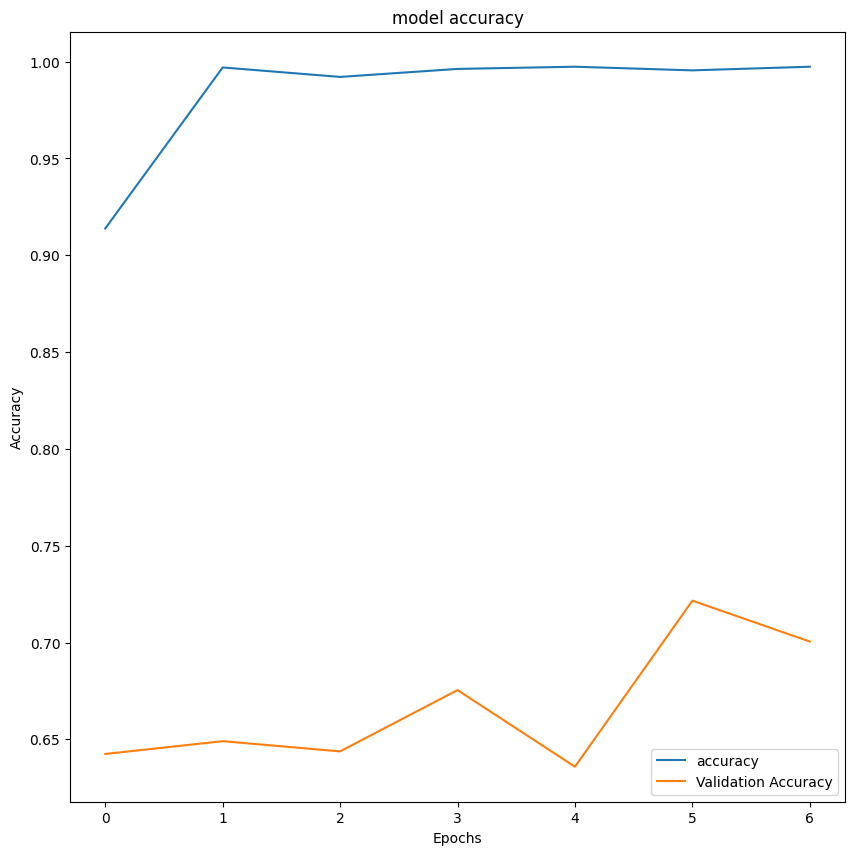

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(efficientnet_hist.history['accuracy'])
plt.plot(efficientnet_hist.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend(["accuracy","Validation Accuracy"])
plt.show()

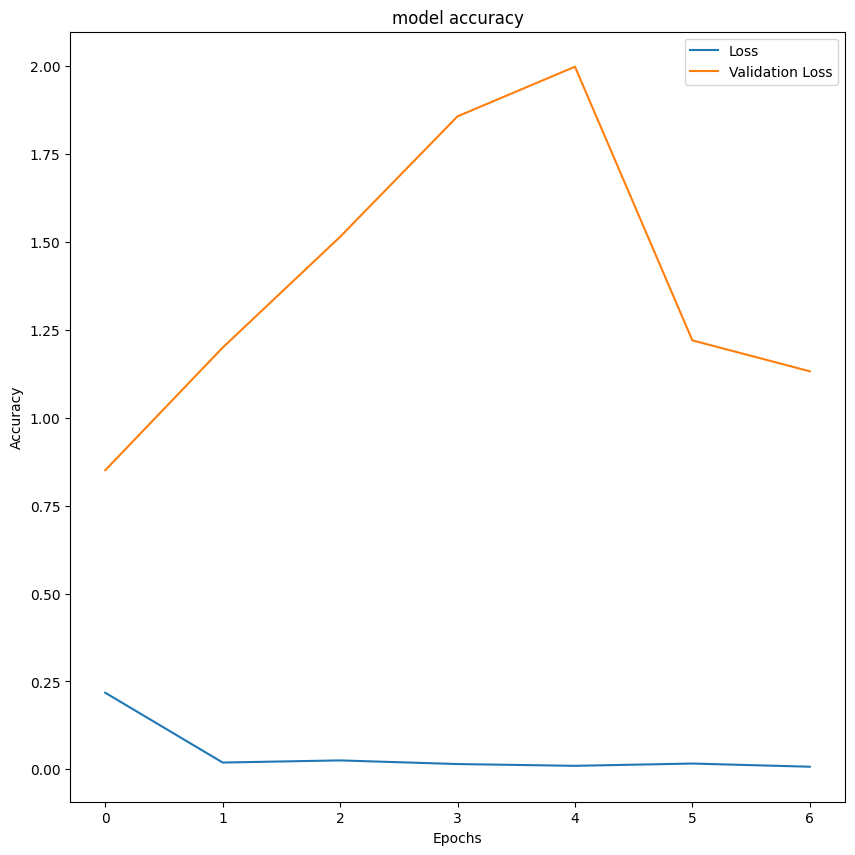

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(efficientnet_hist.history['loss'])
plt.plot(efficientnet_hist.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend(["Loss","Validation Loss"])
plt.show()

**Evaluate EfficientNet Model**

In [ ]:
import keras
from keras.layers import Activation
from keras import backend as K

# Define the swish function
def swish(x, beta = 1):
  return (x * K.sigmoid(beta * x))

# Register the swish function as a custom object
keras.utils.get_custom_objects().update({'swish': swish})

# Load the model with the custom_objects parameter
efficient_model = keras.models.load_model('/content/drive/MyDrive/models/efficientnet_new.keras', custom_objects={'swish': swish})


In [ ]:
y_test =test_generator.classes
predictions = efficientnet_model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

12/12 ━━━━━━━━━━━━━━━━━━━━ 108s 9s/step


,Actual,Prediction
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
373,1,1
374,1,1
375,1,1
376,1,1


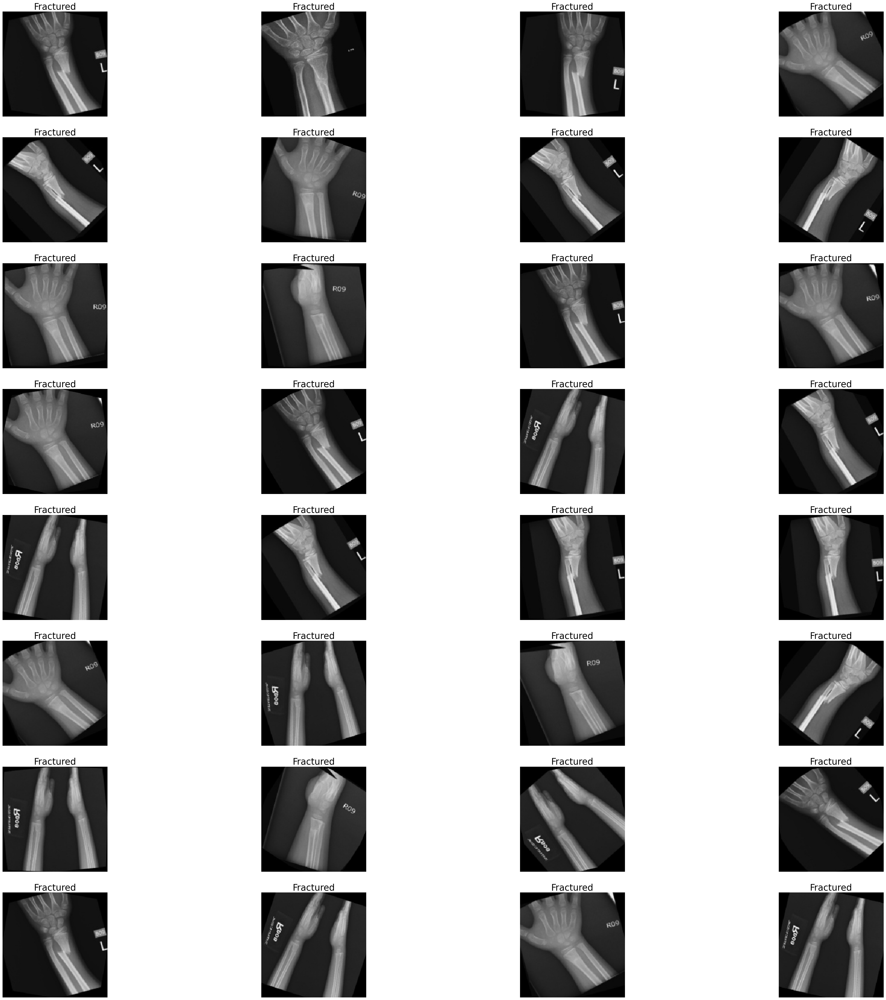

In [ ]:
class_names=['Fractured', 'Not Fractured']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)

array([[180,   9],
       [ 13, 176]])

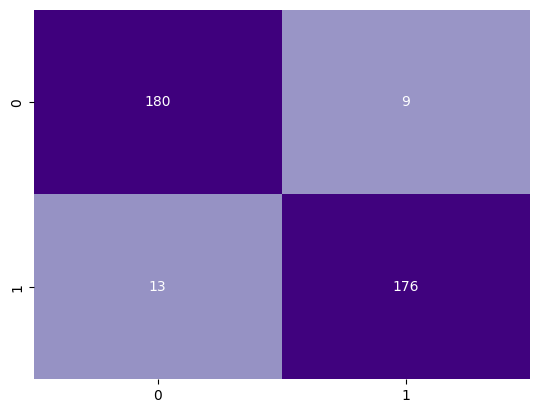

In [ ]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Purples')
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred)
print("EfficientNet Classification Report is : \n", ClassificationReport )

EfficientNet Classification Report is : 
               precision    recall  f1-score   support

           0       0.93      0.95      0.94       189
           1       0.95      0.93      0.94       189

    accuracy                           0.94       378
   macro avg       0.94      0.94      0.94       378
weighted avg       0.94      0.94      0.94       378



# **VGG16**

In [ ]:
vgg16_model=configure_model(model=VGG16)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
vgg16_model=model(vgg16_model)

In [ ]:
opt=tf.keras.optimizers.Adam(0.0001)
vgg16_model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
vgg16_hist=vgg16_model.fit(train_generator,epochs=7,validation_data=val_generator,callbacks=callbacks)

Epoch 1/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 844ms/step - accuracy: 0.4868 - loss: 0.7050
Epoch 1: val_loss improved from 0.85083 to 0.69304, saving model to /content/drive/MyDrive/models/efficientnet_new.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.4869 - loss: 0.7049 - val_accuracy: 0.5000 - val_loss: 0.6930 - learning_rate: 1.0000e-04
Epoch 2/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - accuracy: 0.5246 - loss: 0.6934
Epoch 2: val_loss improved from 0.69304 to 0.69300, saving model to /content/drive/MyDrive/models/efficientnet_new.keras
84/84 ━━━━━━━━━━━━━━━━━━━━ 91s 740ms/step - accuracy: 0.5247 - loss: 0.6934 - val_accuracy: 0.5053 - val_loss: 0.6930 - learning_rate: 1.0000e-04
Epoch 3/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 654ms/step - accuracy: 0.5417 - loss: 0.6935
Epoch 3: val_loss did not improve from 0.69300
84/84 ━━━━━━━━━━━━━━━━━━━━ 79s 707ms/step - accuracy: 0.5415 - loss: 0.6935 - val_accuracy: 0.5000 - val_loss: 0.6991 - learning_rate: 1.0000e-04
Epoch 4/7
84/84 ━━━━

In [ ]:
# if its okay, run this
vgg16_model.save('/content/drive/MyDrive/models/vgg16_model.h5')

In [ ]:
vgg16_hist_=pd.DataFrame(vgg16_hist.history)
vgg16_hist_

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.498871,0.695990,0.500000,0.693044,0.000100
1,0.536494,0.693169,0.505277,0.693003,0.000100
2,0.530474,0.693573,0.500000,0.699091,0.000100
3,0.506020,0.693251,0.543536,0.693137,0.000100
4,0.499248,0.693157,0.534301,0.693139,0.000100
5,0.485327,0.693157,0.500000,0.693142,0.000090
6,0.492476,0.693156,0.500000,0.693147,0.000082


**Plot Training & Val for VGG16 Model**

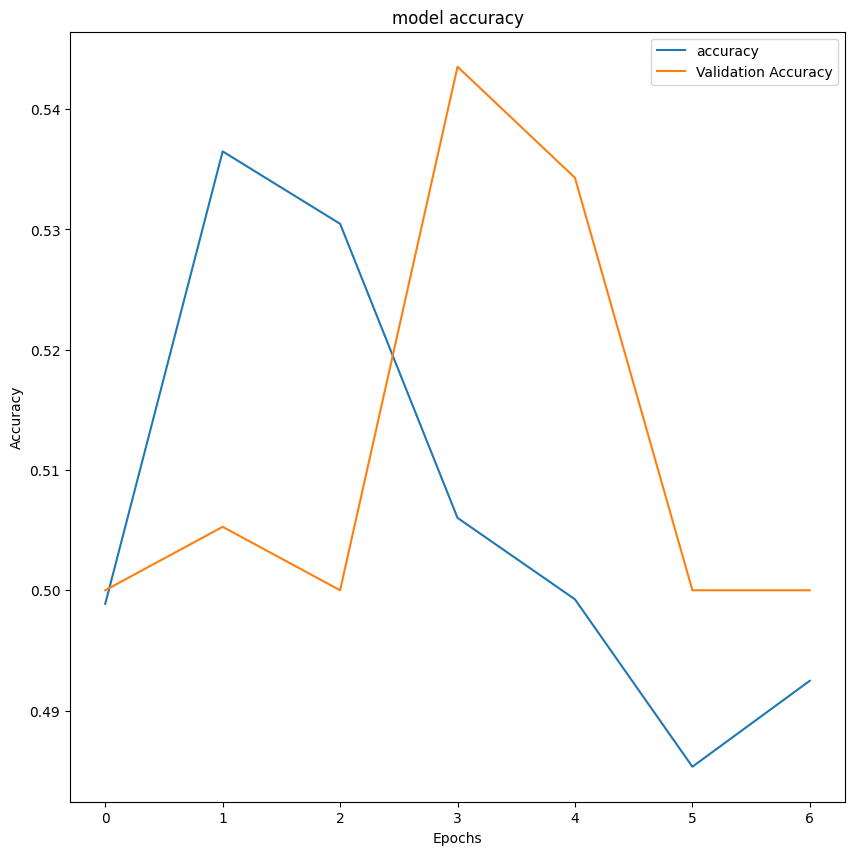

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(vgg16_hist.history['accuracy'])
plt.plot(vgg16_hist.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend(["accuracy","Validation Accuracy"])
plt.show()

**Evaluate VGG16 Model**

In [ ]:
y_test =test_generator.classes
predictions = vgg16_model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step


,Actual,Prediction
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
373,1,0
374,1,0
375,1,0
376,1,0


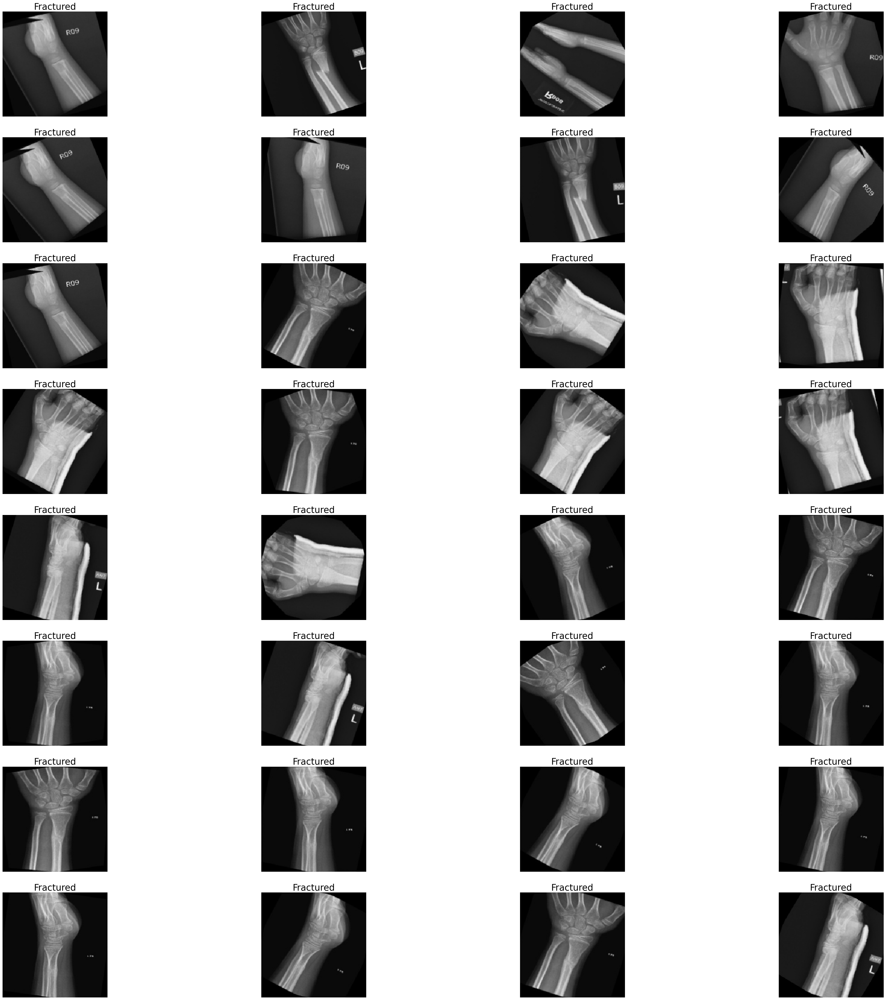

In [ ]:
class_names=['Fractured', 'Not Fractured']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)

array([[189,   0],
       [189,   0]])

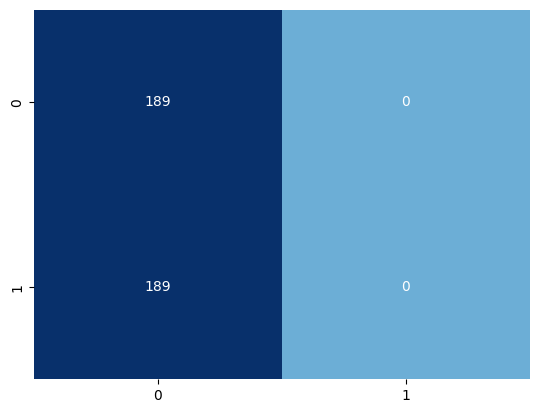

In [ ]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred)
print("VGG16 Classification Report is : \n", ClassificationReport )

VGG16 Classification Report is : 
               precision    recall  f1-score   support

           0       0.50      1.00      0.67       189
           1       0.00      0.00      0.00       189

    accuracy                           0.50       378
   macro avg       0.25      0.50      0.33       378
weighted avg       0.25      0.50      0.33       378



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# **RESNET50**

In [ ]:
resnet50_model=configure_model(model=ResNet50)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
resnet50_model=model(resnet50_model)

In [ ]:
opt=tf.keras.optimizers.Adam(0.0001)
resnet50_model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
resnet50_hist=resnet50_model.fit(train_generator,epochs=7,validation_data=val_generator,callbacks=callbacks)

Epoch 1/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 751ms/step - accuracy: 0.8959 - loss: 0.2050
Epoch 1: val_loss did not improve from 0.69300
84/84 ━━━━━━━━━━━━━━━━━━━━ 144s 895ms/step - accuracy: 0.8967 - loss: 0.2036 - val_accuracy: 0.5000 - val_loss: 0.7829 - learning_rate: 1.0000e-04
Epoch 2/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step - accuracy: 0.9998 - loss: 0.0041
Epoch 2: val_loss did not improve from 0.69300
84/84 ━━━━━━━━━━━━━━━━━━━━ 42s 490ms/step - accuracy: 0.9998 - loss: 0.0041 - val_accuracy: 0.5000 - val_loss: 0.8816 - learning_rate: 1.0000e-04
Epoch 3/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.9861 - loss: 0.0361
Epoch 3: val_loss did not improve from 0.69300
84/84 ━━━━━━━━━━━━━━━━━━━━ 82s 485ms/step - accuracy: 0.9861 - loss: 0.0361 - val_accuracy: 0.5053 - val_loss: 0.7852 - learning_rate: 1.0000e-04
Epoch 4/7
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step - accuracy: 0.9975 - loss: 0.0079
Epoch 4: val_loss did not improve from 0.69300
84/84 ━━━━━━━━━━━━━━━━━━━━ 83s 50

In [ ]:
resnet50_hist_=pd.DataFrame(resnet50_hist.history)
resnet50_hist_

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.963506,0.085250,0.500000,0.782911,0.000100
1,0.999624,0.002790,0.500000,0.881639,0.000100
2,0.984951,0.042705,0.505277,0.785217,0.000100
3,0.998495,0.004961,0.511873,0.720072,0.000100
4,0.999248,0.012852,0.536939,0.785120,0.000100
5,1.000000,0.000324,0.416887,0.879580,0.000090
6,1.000000,0.000218,0.333773,1.133410,0.000082


**Plot Training & Val for VGG16 Model**

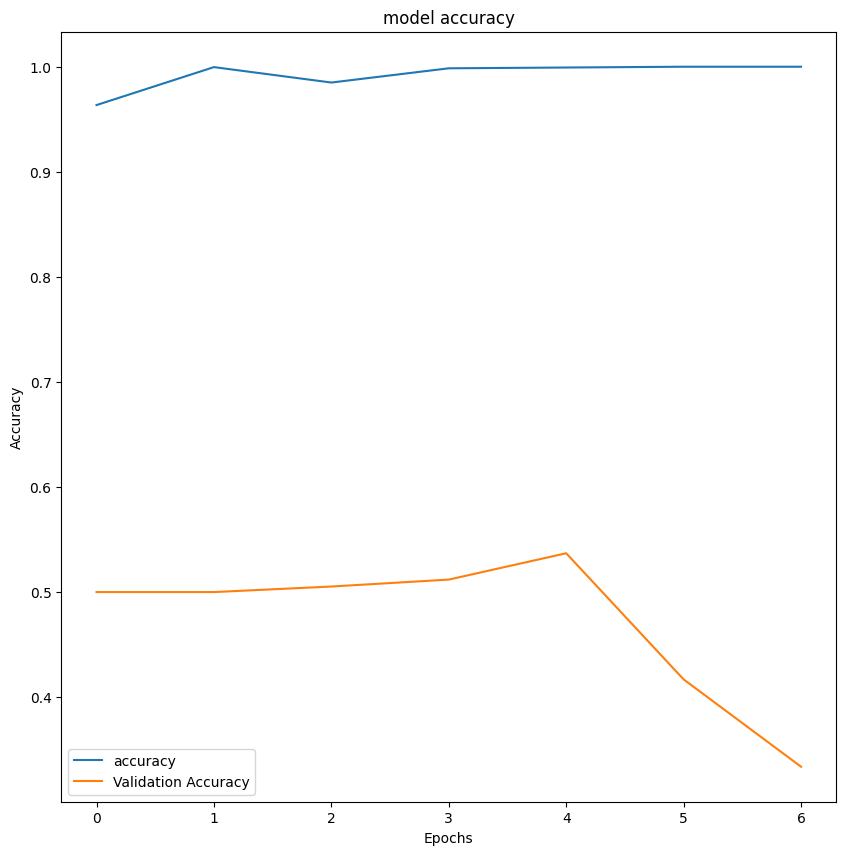

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(resnet50_hist.history['accuracy'])
plt.plot(resnet50_hist.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend(["accuracy","Validation Accuracy"])
plt.show()

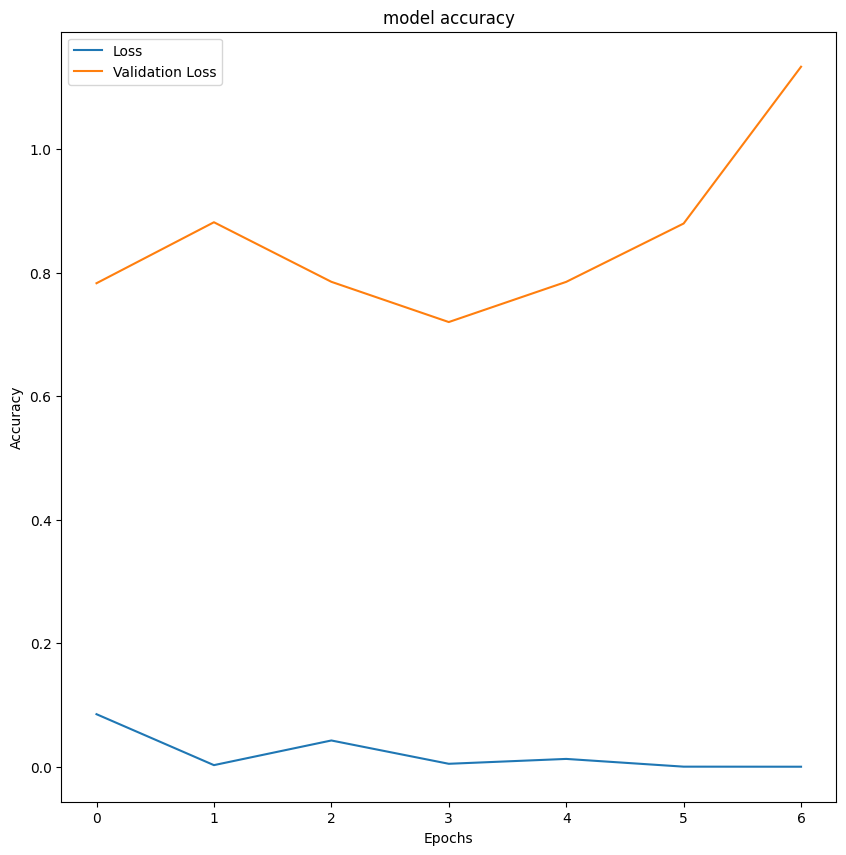

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(resnet50_hist.history['loss'])
plt.plot(resnet50_hist.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend(["Loss","Validation Loss"])
plt.show()

**Evaluate VGG16 Model**

In [ ]:
y_test =test_generator.classes
predictions = resnet50_model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 673ms/step


,Actual,Prediction
0,0,0
1,0,1
2,0,0
3,0,1
4,0,1
...,...,...
373,1,1
374,1,0
375,1,0
376,1,1


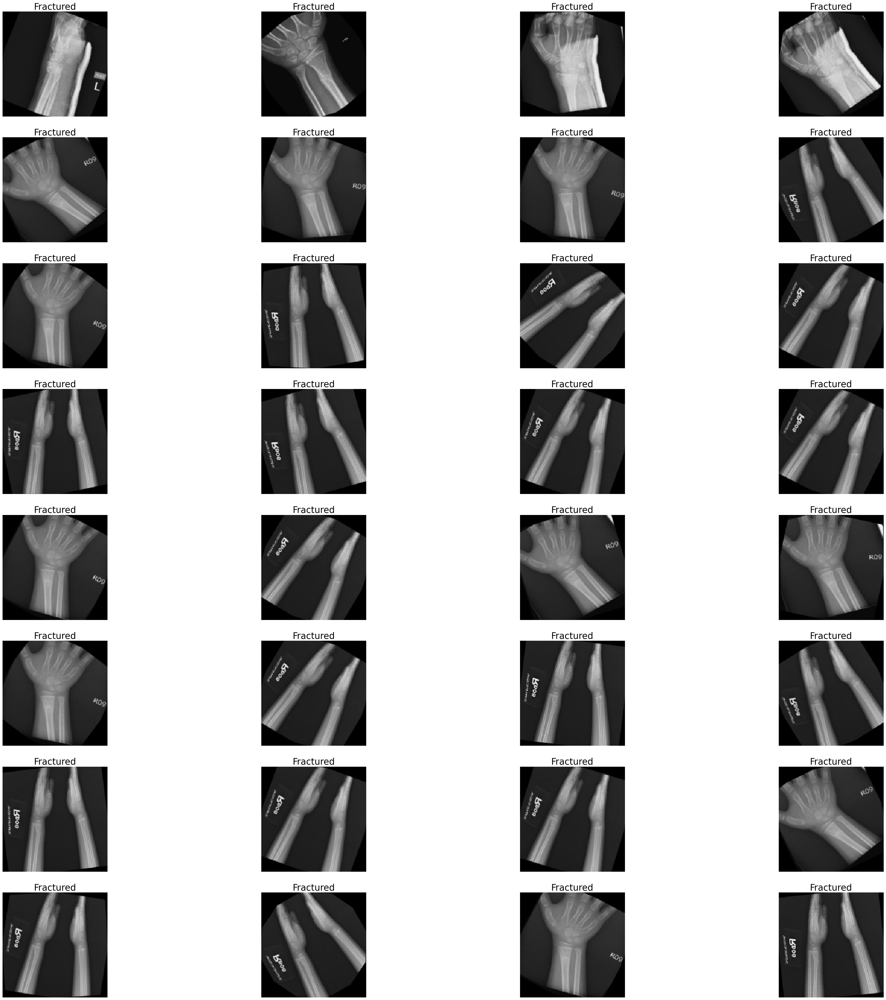

In [ ]:
class_names=['Fractured', 'Not Fractured']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)

array([[ 39, 150],
       [ 63, 126]])

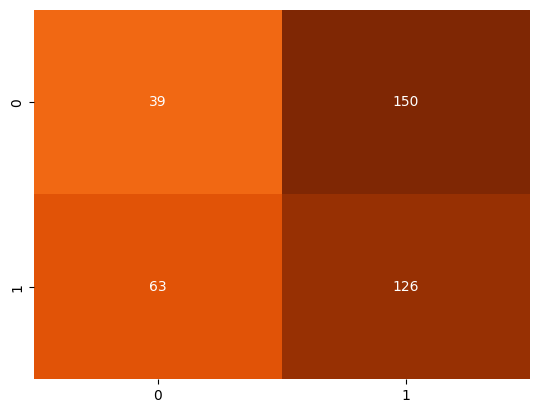

In [ ]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap= 'Oranges')
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred)
print("ResNet 50 Classification Report is : \n", ClassificationReport )

ResNet 50 Classification Report is : 
               precision    recall  f1-score   support

           0       0.38      0.21      0.27       189
           1       0.46      0.67      0.54       189

    accuracy                           0.44       378
   macro avg       0.42      0.44      0.40       378
weighted avg       0.42      0.44      0.40       378

